## Filter

## Definitions

In [1]:
def percentile_stretch(arr, l = 0.05, h=0.95):
    arr = arr.astype(np.float64).copy()
    ql, qh = np.quantile(arr, l), np.quantile(arr, h)
    arr[arr < ql] = ql
    arr[arr > qh] = qh
    arr = (arr - arr.min()) / (arr.max() - arr.min())
    return arr

In [2]:
import numpy as np
from scipy.ndimage import convolve
import matplotlib.pyplot as plt

def anisotropic_gaussian_kernel(sigma_x, sigma_y, sigma_z, size=None):
    """
    Generate an anisotropic 3D Gaussian kernel.
    
    Parameters:
        sigma_x, sigma_y, sigma_z: Standard deviations along x, y, z axes.
        size: Size of the kernel (optional). If None, it is automatically determined.
    
    Returns:
        kernel: 3D anisotropic Gaussian kernel.
    """
    if size is None:
        # Automatically determine kernel size based on sigmas
        size = [int(2 * np.ceil(3 * s) + 1) for s in [sigma_x, sigma_y, sigma_z]]
    
    # Create a grid of coordinates
    x = np.arange(-(size[0] // 2), size[0] // 2 + 1)
    y = np.arange(-(size[1] // 2), size[1] // 2 + 1)
    z = np.arange(-(size[2] // 2), size[2] // 2 + 1)
    xx, yy, zz = np.meshgrid(x, y, z, indexing='ij')
    
    # Compute the anisotropic Gaussian kernel
    kernel = np.exp(-(xx**2 / (2 * sigma_x**2))\
                      - (yy**2 / (2 * sigma_y**2))\
                      - (zz**2 / (2 * sigma_z**2)))
    kernel /= (2 * np.pi)**1.5 * sigma_x * sigma_y * sigma_z  # Normalize
    return kernel

def anisotropic_gaussian_second_derivatives(sigma_x, sigma_y, sigma_z):
    """
    Generate second-order partial derivatives of the anisotropic Gaussian kernel.
    
    Parameters:
        sigma_x, sigma_y, sigma_z: Standard deviations along x, y, z axes.
        size: Size of the kernel (optional). If None, it is automatically determined.
    
    Returns:
        G_xx, G_yy, G_zz, G_xy, G_xz, G_yz: Second-order partial derivatives.
    """
    # Generate the anisotropic Gaussian kernel
    kernel = anisotropic_gaussian_kernel(sigma_x, sigma_y, sigma_z)

    size_x = int(2 * np.ceil(3 * sigma_x) + 1)
    size_y = int(2 * np.ceil(3 * sigma_y) + 1)
    size_z = int(2 * np.ceil(3 * sigma_z) + 1)
    x = np.arange(-(size_x // 2), size_x // 2 + 1)
    y = np.arange(-(size_y // 2), size_y // 2 + 1)
    z = np.arange(-(size_z // 2), size_z // 2 + 1)
    xx, yy, zz = np.meshgrid(x, y, z, indexing='ij')
    
    # Compute second-order partial derivatives
    G_xx = kernel * (xx**2 / sigma_x**4 - 1 / sigma_x**2)
    G_yy = kernel * (yy**2 / sigma_y**4 - 1 / sigma_y**2)
    G_zz = kernel * (zz**2 / sigma_z**4 - 1 / sigma_z**2)
    G_xy = kernel * (xx * yy / (sigma_x**2 * sigma_y**2))
    G_xz = kernel * (xx * zz / (sigma_x**2 * sigma_z**2))
    G_yz = kernel * (yy * zz / (sigma_y**2 * sigma_z**2))
    
    return G_xx, G_yy, G_zz, G_xy, G_xz, G_yz

def hessian_matrix_anisotropic(image, sigma_x, sigma_y, sigma_z):
    """
    Compute the Hessian matrix of an image using anisotropic Gaussian derivatives.
    
    Parameters:
        image: 3D input image.
        sigma_x, sigma_y, sigma_z: Standard deviations along x, y, z axes.
    
    Returns:
        H_xx, H_xy, H_xz, H_yy, H_yz, H_zz: Components of the Hessian matrix.
    """
    # Get second-order partial derivatives of the anisotropic Gaussian
    G_xx, G_yy, G_zz, G_xy, G_xz, G_yz = anisotropic_gaussian_second_derivatives(sigma_x, sigma_y, sigma_z)
    
    # Convolve the image with the second-order derivatives
    # H_xx = convolve(image, G_xx, mode='constant', cval=0)
    # H_yy = convolve(image, G_yy, mode='constant', cval=0)
    # H_zz = convolve(image, G_zz, mode='constant', cval=0)
    # H_xy = convolve(image, G_xy, mode='constant', cval=0)
    # H_xz = convolve(image, G_xz, mode='constant', cval=0)
    # H_yz = convolve(image, G_yz, mode='constant', cval=0)

    H_xx = convolve(image, G_xx)
    H_yy = convolve(image, G_yy)
    H_zz = convolve(image, G_zz)
    H_xy = convolve(image, G_xy)
    H_xz = convolve(image, G_xz)
    H_yz = convolve(image, G_yz)
    
    return H_xx, H_xy, H_xz, H_yy, H_yz, H_zz

def eigen_decomposition_3d(H_xx, H_xy, H_xz, H_yy, H_yz, H_zz):
    """
    Compute eigenvalues and eigenvectors of a 3D Hessian matrix.
    
    Parameters:
        H_xx, H_xy, H_xz, H_yy, H_yz, H_zz: Components of the 3D Hessian matrix.
    
    Returns:
        eigenvalues: Array of eigenvalues.
        eigenvectors: Array of eigenvectors (as column vectors).
    """
    # Construct the Hessian matrix
    H = np.array([
        [H_xx, H_xy, H_xz],
        [H_xy, H_yy, H_yz],
        [H_xz, H_yz, H_zz]
    ])
    
    # Compute eigenvalues and eigenvectors
    eigenvalues, eigenvectors = np.linalg.eig(H)
    
    return eigenvalues, eigenvectors

def merjeling_filter(img, sigmas, alpha):
    sigma_x, sigma_y, sigma_z = sigmas
    kernel = anisotropic_gaussian_kernel(sigma_x, sigma_y, sigma_z)
    H_xx, H_xy, H_xz, H_yy, H_yz, H_zz = hessian_matrix_anisotropic(img, sigma_x, sigma_y, sigma_z)

    ## Modify the hessians and process
    #Hn_xx = alpha*H_xx + H_yy + H_zz
    #Hn_yy = H_xx + alpha*H_yy + H_zz
    #Hn_zz = H_xx + H_yy + alpha*H_zz

    result = np.zeros_like(img, dtype=np.float64)
    minimum_lam = np.inf

    # Print the shape of the Hessian components
    print("H_xx shape:", H_xx.shape)
    print("H_xy shape:", H_xy.shape)
    print("H_xz shape:", H_xz.shape)
    print("H_yy shape:", H_yy.shape)
    print("H_yz shape:", H_yz.shape)
    print("H_zz shape:", H_zz.shape)

    H = np.array([
        [H_xx, H_xy, H_xz],
        [H_xy, H_yy, H_yz],
        [H_xz, H_yz, H_zz]
    ])  # Shape: (3, 3, H, W, D)

    # Move the matrix dimensions to the end for easier computation
    H = np.moveaxis(H, [0, 1], [-2, -1])  # Shape: (H, W, D, 3, 3)

    # Compute eigenvalues of the Hessian matrix
    eigvals = np.linalg.eigvalsh(H)  # Shape: (H, W, D, 3)
    lambda1, lambda2, lambda3 = eigvals[..., 0], eigvals[..., 1], eigvals[..., 2]

    # Compute modified eigenvalues
    #lam1 = lambda1 + alpha * lambda2 + alpha * lambda3
    #lam2 = alpha * lambda1 + lambda2 + alpha * lambda3
    #lam3 = alpha * lambda1 + alpha * lambda2 + lambda3
    lam1 = lambda1 * alpha + lambda2 + lambda3
    lam2 = lambda1 + alpha * lambda2 + lambda3
    lam3 = lambda1 + lambda2 + alpha * lambda3
    lams = np.array([lam1, lam2, lam3])  # Shape: (H, W, D, 3)
    
    # Compute the maximum eigenvalue at each pixel
    max_lam = np.take_along_axis(lams, abs(lams).argmax(0)[None], 0).squeeze(0)
    
    # Initialize the result array
    result = np.zeros_like(img, dtype=np.float64)

    # Set negative values in the result
    result[max_lam < 0] = max_lam[max_lam < 0]
    
    # Find the minimum of all eigenvalues
    minimum_lam = np.min(max_lam)

    # Normalize the result
    result /= minimum_lam

    print(f"minimum_lam={minimum_lam}")
    print(f"range of values = [{result.min():0.3f};{result.max():0.3f}]")
    
    return result


H_xx shape: (64, 64, 64)
H_xy shape: (64, 64, 64)
H_xz shape: (64, 64, 64)
H_yy shape: (64, 64, 64)
H_yz shape: (64, 64, 64)
H_zz shape: (64, 64, 64)
H_xx shape: (64, 64, 64)
H_xy shape: (64, 64, 64)
H_xz shape: (64, 64, 64)
H_yy shape: (64, 64, 64)
H_yz shape: (64, 64, 64)
H_zz shape: (64, 64, 64)
minimum_lam=-0.10945008473008154
range of values = [-0.000;1.000]


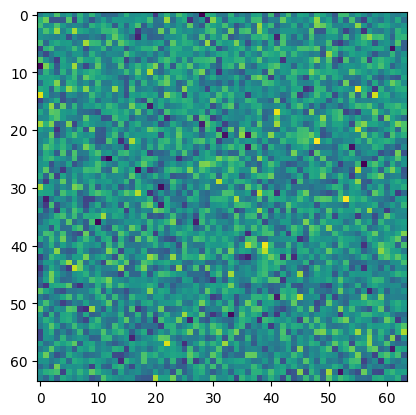

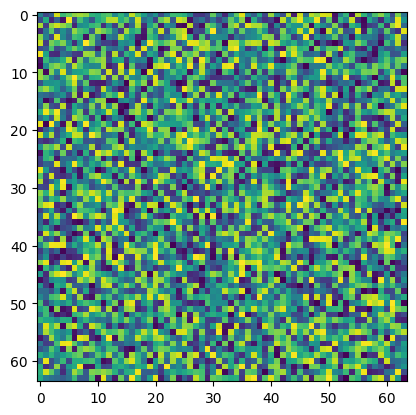

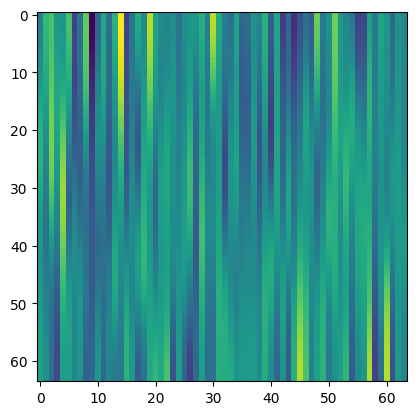

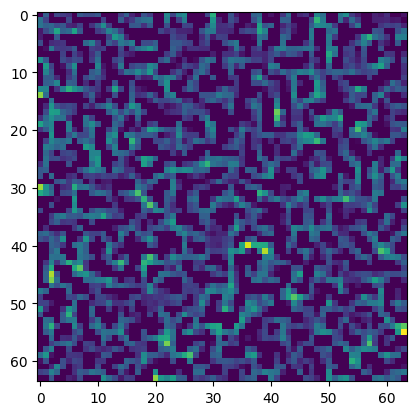

In [3]:
# Example usage
if __name__ == "__main__":
    # Load or create a 3D image (replace this with your image)
    image = np.random.rand(64, 64, 64)  # Example 3D image
    
    # Define anisotropic standard deviations
    sigma_x, sigma_y, sigma_z = 10.0, 0.1, 0.1


    kernel = anisotropic_gaussian_kernel(sigma_x, sigma_y, sigma_z)

    convolved = convolve(image, kernel, mode='reflect')

    plt.figure()
    plt.imshow(convolved[0])


    plt.figure()
    plt.imshow(image[0])

    plt.figure()
    plt.imshow(convolved[:,:,0])


    # Now do the Hessians2
    
    # # Compute the Hessian matrix components
    H_xx, H_xy, H_xz, H_yy, H_yz, H_zz = hessian_matrix_anisotropic(image, sigma_x, sigma_y, sigma_z)
    
    # Print the shape of the Hessian components
    print("H_xx shape:", H_xx.shape)
    print("H_xy shape:", H_xy.shape)
    print("H_xz shape:", H_xz.shape)
    print("H_yy shape:", H_yy.shape)
    print("H_yz shape:", H_yz.shape)
    print("H_zz shape:", H_zz.shape)

    result = merjeling_filter(image, [10.0, 1.0, 1.0], -2/3)
    plt.figure()
    plt.imshow(result[0])



In [4]:
result.min()

np.float64(-0.0)

In [5]:
result.max()

np.float64(1.0)

# Our data

In [72]:
import skimage

In [73]:
raw_data = skimage.io.imread('180322_Sqh-mCh Tub-GFP 16h_110_time-10.tif.files.tif')

In [74]:
sigma = 2
filtered = merjeling_filter(raw_data.astype(np.float64), [sigma / 7, sigma, sigma], 1/3)


H_xx shape: (7, 512, 512)
H_xy shape: (7, 512, 512)
H_xz shape: (7, 512, 512)
H_yy shape: (7, 512, 512)
H_yz shape: (7, 512, 512)
H_zz shape: (7, 512, 512)
minimum_lam=-60085.3243575661
range of values = [0.067;1.000]


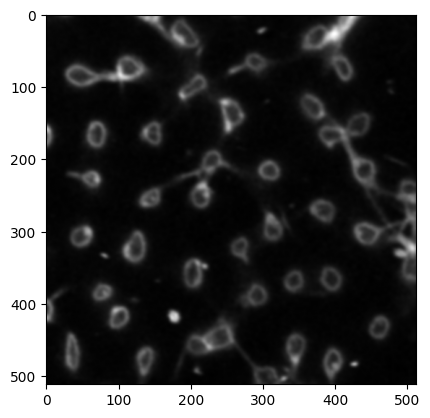

In [75]:
plt.figure()
plt.imshow(filtered[0], 'gray')

H_xx shape: (7, 512, 512)
H_xy shape: (7, 512, 512)
H_xz shape: (7, 512, 512)
H_yy shape: (7, 512, 512)
H_yz shape: (7, 512, 512)
H_zz shape: (7, 512, 512)
minimum_lam=-127915.8258802864
range of values = [0.073;1.000]


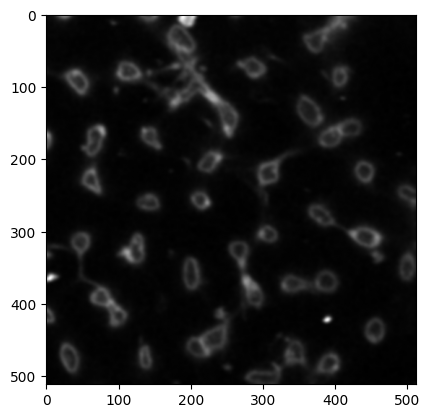

In [76]:
sigma = 2
filtered = merjeling_filter(raw_data.astype(np.float64), [sigma / 9, sigma, sigma], -2/3)
plt.figure()
plt.imshow(filtered[3], 'gray')

H_xx shape: (7, 512, 512)
H_xy shape: (7, 512, 512)
H_xz shape: (7, 512, 512)
H_yy shape: (7, 512, 512)
H_yz shape: (7, 512, 512)
H_zz shape: (7, 512, 512)
minimum_lam=-30372.06437935866
range of values = [0.018;1.000]


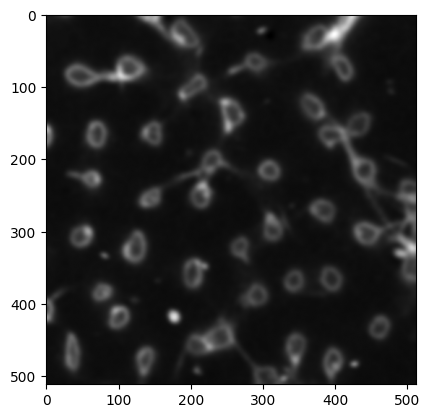

In [77]:
sigma = 3
filtered = merjeling_filter(raw_data.astype(np.float64), [sigma / 9, sigma, sigma], -2/3)
plt.figure()
plt.imshow(filtered[0], 'gray')

In [78]:
filtered.max()

np.float64(1.0)

In [79]:
filtered.min()

np.float64(0.017774953119420223)

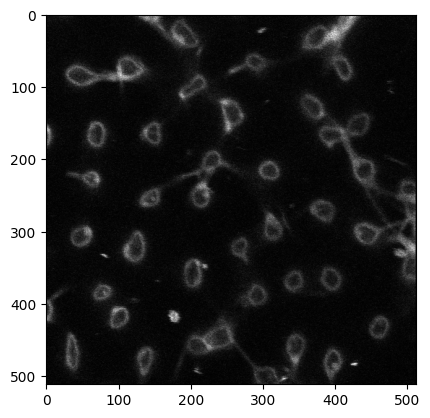

In [80]:
plt.imshow(raw_data[0], 'gray')

H_xx shape: (7, 512, 512)
H_xy shape: (7, 512, 512)
H_xz shape: (7, 512, 512)
H_yy shape: (7, 512, 512)
H_yz shape: (7, 512, 512)
H_zz shape: (7, 512, 512)
minimum_lam=-11265.26472973802
range of values = [-0.000;1.000]


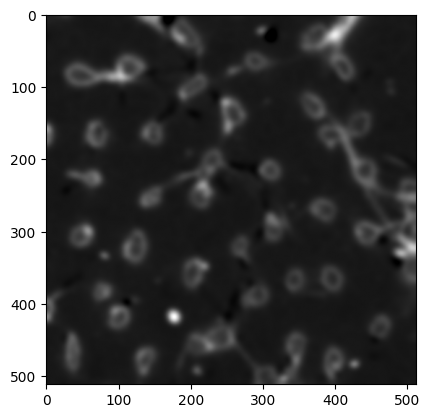

In [81]:
sigma = 4
filtered = merjeling_filter(raw_data.astype(np.float64), [sigma / 9, sigma, sigma], -2/3)
plt.figure()
plt.imshow(filtered[0], 'gray')

In [82]:
%%script echo skipping
sigma = 5
filtered = merjeling_filter(raw_data.astype(np.float64), [sigma / 9, sigma, sigma], -2/3)
plt.figure()
plt.imshow(filtered[0], 'gray')

skipping


In [83]:
%%script echo skipping
sigma = 3
filtered = merjeling_filter(1.0-raw_data.astype(np.float64)/raw_data.max(), [sigma / 9, sigma, sigma], -2/3)
plt.figure()
plt.imshow(filtered[0], 'gray')

skipping


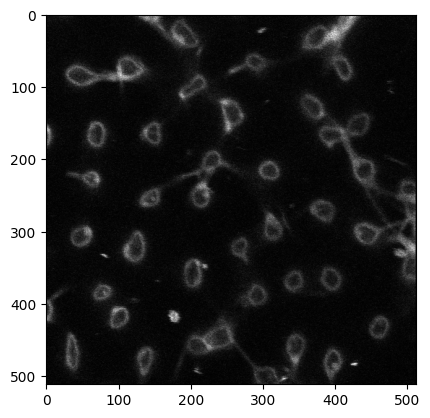

In [84]:
plt.imshow(raw_data[0], 'gray')

## Multiscale approach

### Preprocessing

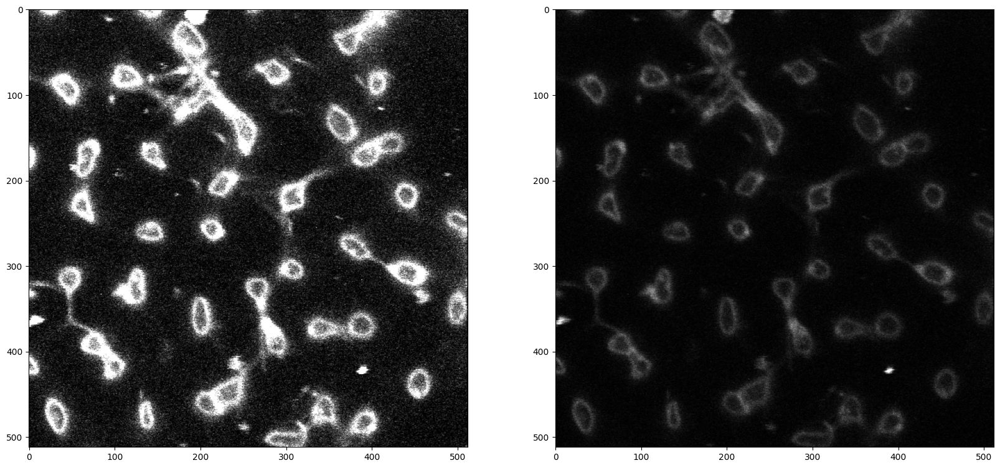

In [85]:
data = percentile_stretch(raw_data, 0.05, 0.95) * 255

idx = 3

fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(20,10))
ax[0].imshow(data[idx], 'gray')
ax[1].imshow(raw_data[idx], 'gray')

In [86]:
# Try local contrast enhancement? due to low contrast
#data = skimage.exposure.equalize_adapthist(data)

# Try to use morph. tophat to enhance sharpness/contrast
#data = 3 * data - skimage.morphology.opening(data, footprint=skimage.morphology.ball(10)) - skimage.morphology.closing(data, footprint=skimage.morphology.ball(10))
data = data - skimage.morphology.opening(data, footprint=skimage.morphology.ball(5))
#data = skimage.morphology.dilation(data, footprint=skimage.morphology.ball(1))


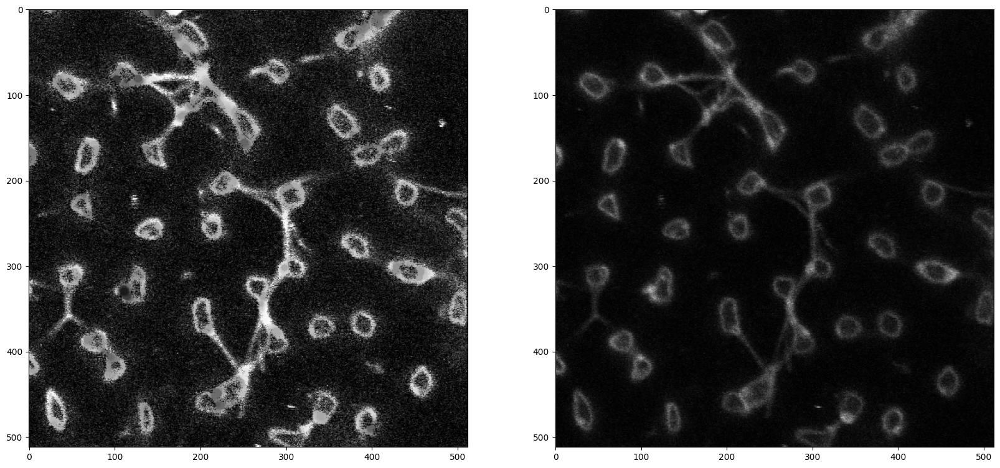

In [87]:
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(20,10))
ax[0].imshow(data[2], 'gray')
ax[1].imshow(raw_data[2], 'gray')

### Vesselness filter

In [88]:
# Different scales
scales = [1, 2, 3, 4, 5]
#scales = [0.25, 0.5, 2,4]
#scales = [0.25, 0.5, 0.75, 1.0]
results = []
print(f"All scales: {scales}")
for scale in scales:
    print(f"scale={scale}")
    results.append(merjeling_filter(data, [scale / 9, scale, scale], -2/3))

All scales: [1, 2, 3, 4, 5]
scale=1
H_xx shape: (7, 512, 512)
H_xy shape: (7, 512, 512)
H_xz shape: (7, 512, 512)
H_yy shape: (7, 512, 512)
H_yz shape: (7, 512, 512)
H_zz shape: (7, 512, 512)
minimum_lam=-74122.48542173799
range of values = [0.003;1.000]
scale=2
H_xx shape: (7, 512, 512)
H_xy shape: (7, 512, 512)
H_xz shape: (7, 512, 512)
H_yy shape: (7, 512, 512)
H_yz shape: (7, 512, 512)
H_zz shape: (7, 512, 512)
minimum_lam=-9249.641570089681
range of values = [0.015;1.000]
scale=3
H_xx shape: (7, 512, 512)
H_xy shape: (7, 512, 512)
H_xz shape: (7, 512, 512)
H_yy shape: (7, 512, 512)
H_yz shape: (7, 512, 512)
H_zz shape: (7, 512, 512)
minimum_lam=-2677.491101005891
range of values = [-0.000;1.000]
scale=4
H_xx shape: (7, 512, 512)
H_xy shape: (7, 512, 512)
H_xz shape: (7, 512, 512)
H_yy shape: (7, 512, 512)
H_yz shape: (7, 512, 512)
H_zz shape: (7, 512, 512)
minimum_lam=-1054.5344737093735
range of values = [-0.000;1.000]
scale=5
H_xx shape: (7, 512, 512)
H_xy shape: (7, 512, 512)
H

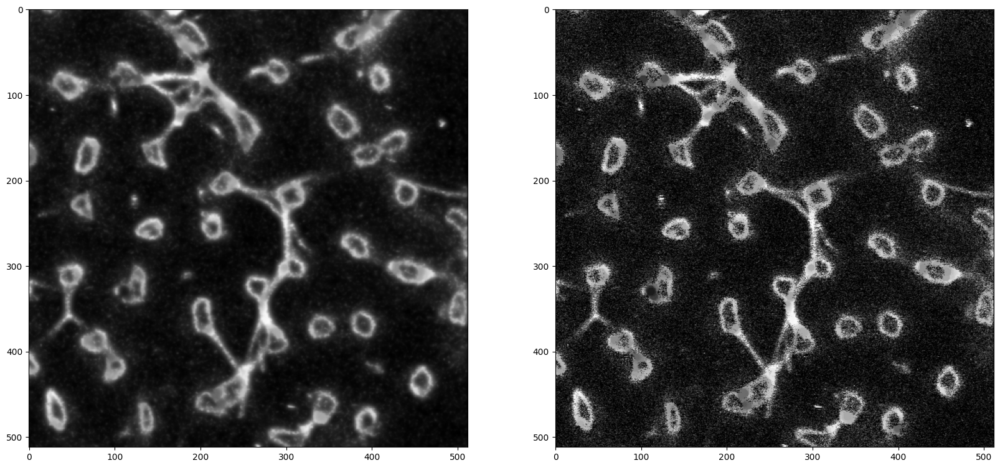

In [89]:
# Multiscale join
multiscale = np.array(results)
fig, ax = plt.subplots(ncols=2, figsize=(20, 10))
ax[0].imshow(multiscale.max(axis=0)[2], 'gray')
ax[1].imshow(data[2], 'gray')

Text(0.5, 1.0, 'max proj')

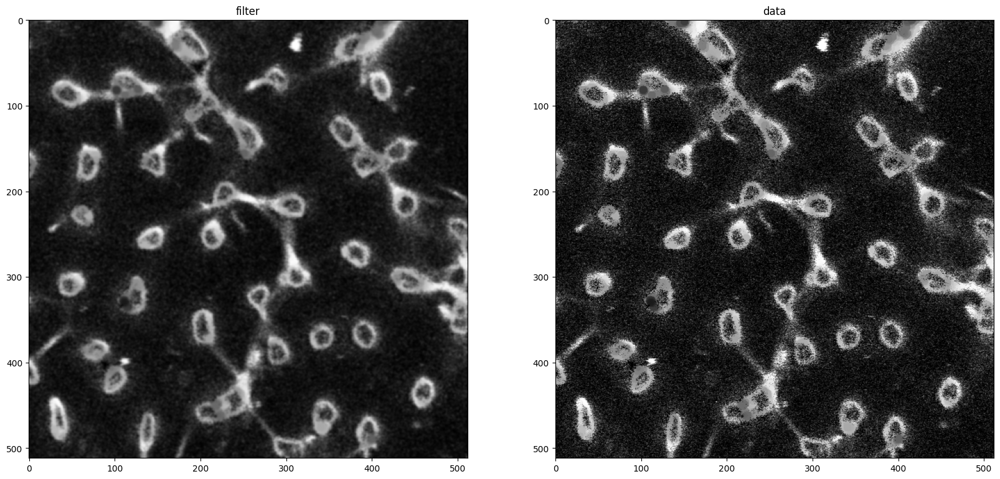

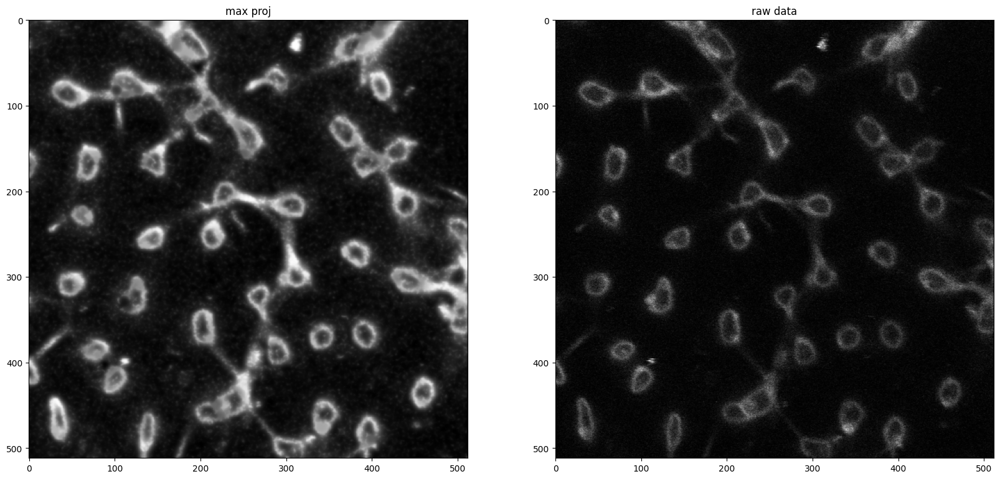

In [90]:
# Multiscale join
multiscale = np.array(results)

idx = 1

fig, ax = plt.subplots(ncols=2, figsize=(20,10))
ax[0].imshow(multiscale[0,idx], 'gray')
ax[0].set_title('filter')
ax[1].imshow(data[idx], 'gray')
ax[1].set_title('data')


# max projection
fig, ax = plt.subplots(ncols=2, figsize=(20,10))

ax[1].set_title('raw data')
ax[1].imshow(raw_data[idx], 'gray')
ax[0].imshow(np.max(multiscale,axis=0)[idx], 'gray')
ax[0].set_title("max proj")

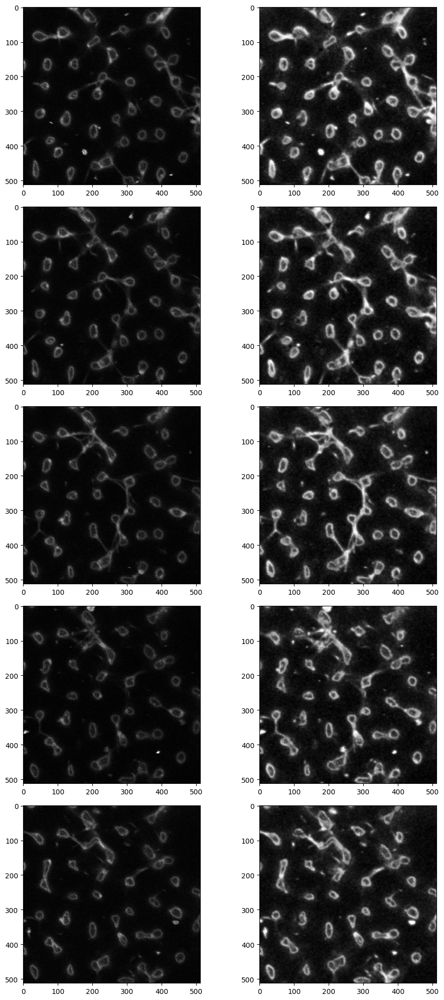

In [91]:
fig, ax = plt.subplots(nrows=5, ncols=2, figsize=(10, 20))
for i in range(5):
    ax[i, 0].imshow(raw_data[i], 'gray')
    ax[i, 1].imshow(np.max(multiscale,axis=0)[i], 'gray')
fig.tight_layout()

In [92]:
multiscale.shape

(5, 7, 512, 512)

### Thresholding

In [93]:
# take best
blurred = np.max(multiscale, axis=0)
assert(blurred.shape == raw_data.shape)

(array([977776., 428395., 123245.,  88229.,  75092.,  62479.,  44614.,
         19866.,   9818.,   5494.]),
 array([0.01914873, 0.11723386, 0.21531898, 0.31340411, 0.41148924,
        0.50957437, 0.60765949, 0.70574462, 0.80382975, 0.90191487,
        1.        ]),
 <BarContainer object of 10 artists>)

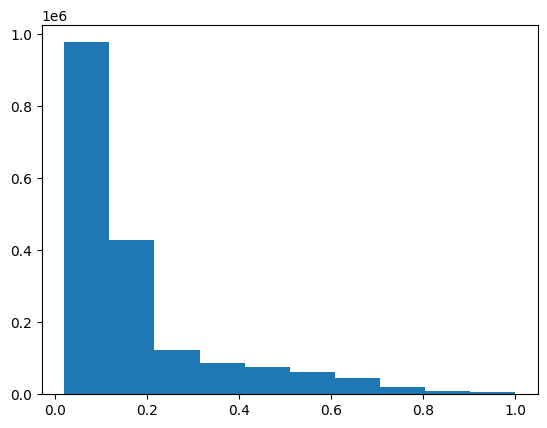

In [94]:
plt.hist(blurred.flatten())

0.22413132040918718


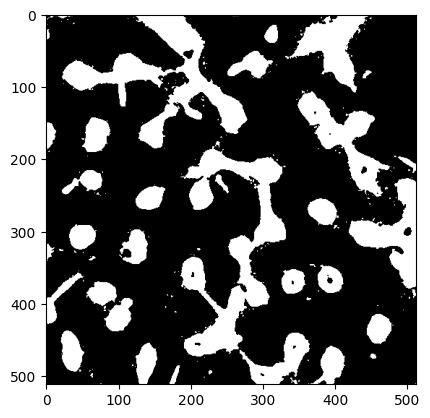

In [119]:
thresh_filt = skimage.filters.threshold_triangle(blurred)
binary_filt = blurred > thresh_filt
print(thresh_filt)
plt.imshow(binary_filt[idx], 'gray')

# plt.figure()
# plt.imshow(data[idx], 'gray')

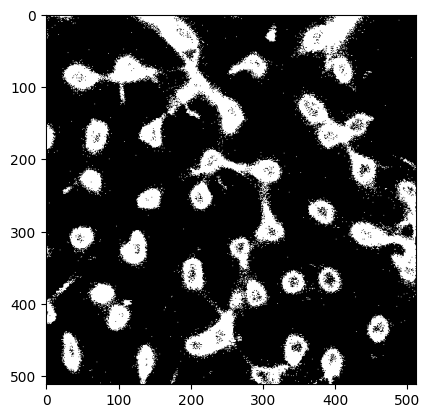

In [120]:
thresh_data = skimage.filters.threshold_triangle(raw_data)
binary_raw = raw_data > thresh_data
plt.imshow(binary_raw[idx], 'gray')

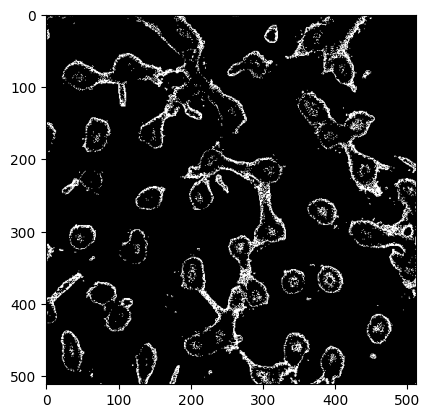

In [121]:
tmp = binary_filt[idx].copy()
tmp[binary_raw[idx] == True] = False
#plt.imshow( binary_filt[idx] - binary_raw[idx], 'gray')
plt.imshow(tmp, 'gray')

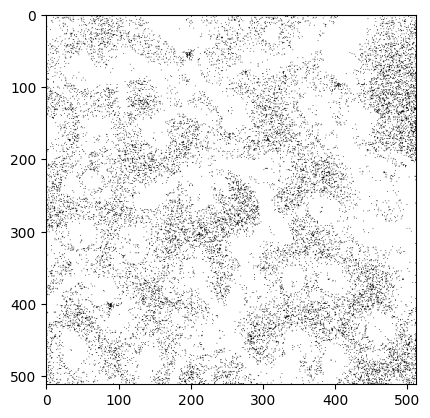

In [122]:
thresh_data = skimage.filters.threshold_triangle(data)
binary_data = data > thresh_data
plt.imshow(binary_data[idx], 'gray')

### Filling holes and labelling

In [123]:
from morphology import create_umbra, fillhole_morphology

In [124]:
# Do frame by frame morpohlogy
filled = np.zeros_like(binary_filt, dtype=np.bool)
print(binary_filt.shape)
for z_idx in range(binary_filt.shape[0]):
    filled[z_idx], _ = fillhole_morphology(binary_filt[z_idx])
print(filled.dtype)

(7, 512, 512)
DEBUG: 2D shape with max=True
DEBUG: 2D shape with max=True
DEBUG: 2D shape with max=True
DEBUG: 2D shape with max=True
DEBUG: 2D shape with max=True
DEBUG: 2D shape with max=True
DEBUG: 2D shape with max=True
bool


DEBUG: 2D shape with max=True


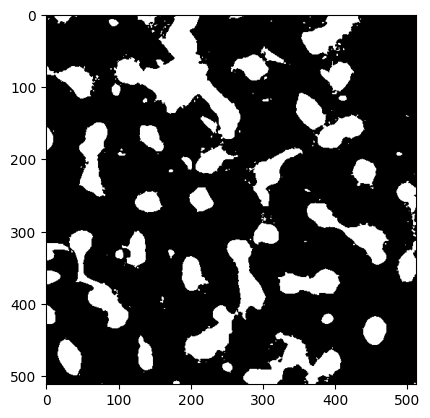

In [125]:
# DEBUG:
plt.imshow(fillhole_morphology(binary_filt[3])[0], 'gray')

#### 3D filtering + 3D Labelling 

In [134]:
# Remove small objects
print(filled.dtype)
filled_no_small_obj = skimage.morphology.remove_small_objects(filled, min_size=400)

bool


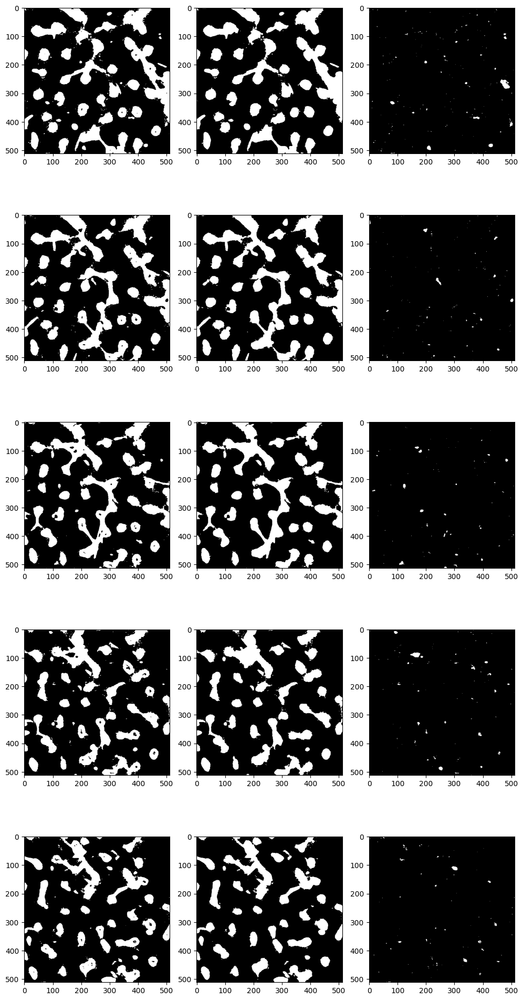

In [133]:
# Compare
fig, ax = plt.subplots(nrows=5, ncols=3, figsize=(10, 20))
for i in range(5):
    ax[i, 0].imshow(binary_filt[i], 'gray')
    ax[i, 1].imshow(filled_no_small_obj[i], 'gray')

    holes = 
    
    ax[i, 2].imshow(skimage.morphology.remove_small_objects(binary_filt[i] ^ filled_no_small_obj[i], min_size=1), 'gray')
fig.tight_layout()

/home/xpetrus/DP/DP-WIP/.venv/lib/python3.13/site-packages/skimage/_shared/utils.py:328: UserWarning: labeled.tif is a low contrast image
  return func(*args, **kwargs)


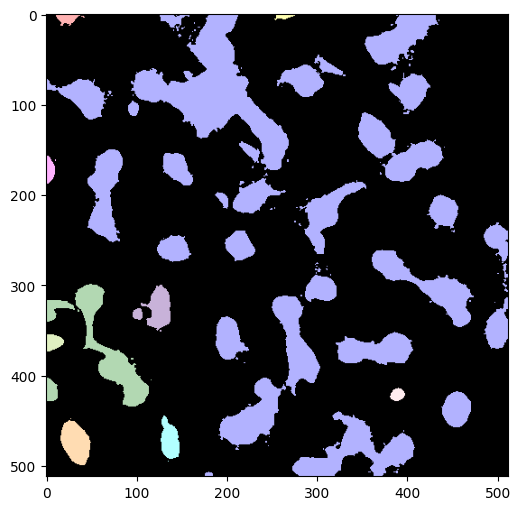

In [104]:
import matplotlib.patches as mpatches

# filled = np.zeros_like(raw_data)
# filled[skimage.morphology.ball(50)] = True

# Labeling
# label image regions
label_image = skimage.measure.label(filled_no_small_obj)
# to make the background transparent, pass the value of `bg_label`,
# and leave `bg_color` as `None` and `kind` as `overlay`
image_label_overlay = skimage.color.label2rgb(label_image, image=filled_no_small_obj, bg_label=0)

fig, ax = plt.subplots(figsize=(10, 6))
ax.imshow(image_label_overlay[3])

skimage.io.imsave("labeled.tif", label_image)
skimage.io.imsave('overlay.tif', image_label_overlay)

for region in skimage.measure.regionprops(label_image):
    break
    # take regions with large enough areas
    if region.area >= 100:
        # draw rectangle around segmented coins
        print(region.bbox)
        minz, minr, minc, maxz, maxr, maxc = region.bbox
        rect = mpatches.Rectangle(
            (minc, minr),
            maxc - minc,
            maxr - minr,
            fill=False,
            edgecolor='red',
            linewidth=2,
        )
        ax.add_patch(rect)

#### 2D cleanup + 3D labelling SKIP

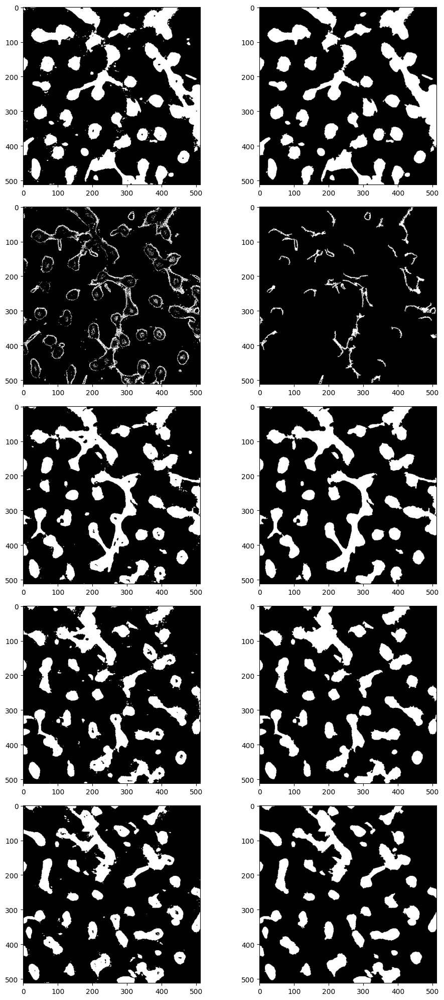

In [105]:
# filled_no_small_obj = np.zeros_like(filled, dtype=np.bool)
# for z_idx in range(filled.shape[0]):
#     filled_no_small_obj[z_idx] = skimage.morphology.remove_small_objects(filled[z_idx], 100)
# # Compare
# fig, ax = plt.subplots(nrows=5, ncols=2, figsize=(10, 20))
# for i in range(5):
#     ax[i, 0].imshow(binary_filt[i], 'gray')
#     ax[i, 1].imshow(filled_no_small_obj[i], 'gray')
# fig.tight_layout()

/home/xpetrus/DP/DP-WIP/.venv/lib/python3.13/site-packages/skimage/_shared/utils.py:328: UserWarning: labeled.tif is a low contrast image
  return func(*args, **kwargs)


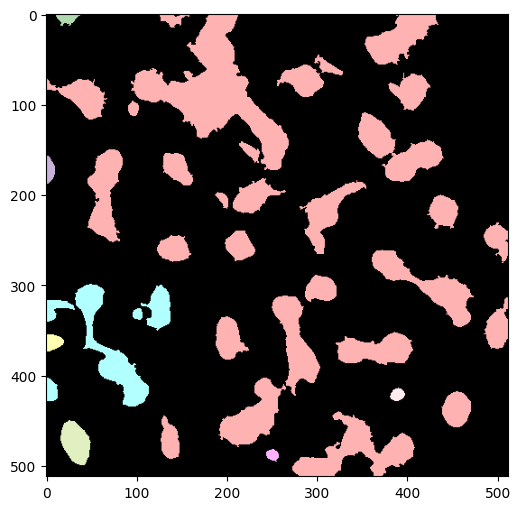

In [106]:
# import matplotlib.patches as mpatches

# # filled = np.zeros_like(raw_data)
# # filled[skimage.morphology.ball(50)] = True

# # Labeling
# # label image regions
# label_image = skimage.measure.label(filled_no_small_obj)
# # to make the background transparent, pass the value of `bg_label`,
# # and leave `bg_color` as `None` and `kind` as `overlay`
# image_label_overlay = skimage.color.label2rgb(label_image, image=filled_no_small_obj, bg_label=0)

# fig, ax = plt.subplots(figsize=(10, 6))
# ax.imshow(image_label_overlay[3])

# skimage.io.imsave("labeled.tif", label_image)
# skimage.io.imsave('overlay.tif', image_label_overlay)

# for region in skimage.measure.regionprops(label_image):
#     break
#     # take regions with large enough areas
#     if region.area >= 100:
#         # draw rectangle around segmented coins
#         print(region.bbox)
#         minz, minr, minc, maxz, maxr, maxc = region.bbox
#         rect = mpatches.Rectangle(
#             (minc, minr),
#             maxc - minc,
#             maxr - minr,
#             fill=False,
#             edgecolor='red',
#             linewidth=2,
#         )
#         ax.add_patch(rect)

#### 2D labeling (z slice by slice) SKIP

In [107]:
# Go slice by slice


### Distance map

In [108]:
from scipy.ndimage import distance_transform_edt

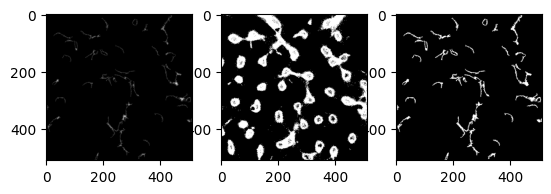

In [118]:
fig, ax = plt.subplots(ncols=3)
ax[0].imshow(distance_transform_edt(filled_no_small_obj[idx]), 'gray')
ax[1].imshow(binary_filt[idx] ^ filled[idx], 'gray')
ax[2].imshow(filled_no_small_obj[idx], 'gray')

### Post-processing

Joining the disconnected parts togerther while removing the noise.

I am thinking about doing morph. reconstruction or hit miss transform.

Maybe dilate a lot, then do and erosion with HMT?

# Other

In [38]:
from skimage import data
from skimage import color
image = color.rgb2gray(data.retina())[300:700, 700:900]/255.0
res = merjeling_filter(1.0-image[..., np.newaxis], [2]*3, -2/3)

H_xx shape: (400, 200, 1)
H_xy shape: (400, 200, 1)
H_xz shape: (400, 200, 1)
H_yy shape: (400, 200, 1)
H_yz shape: (400, 200, 1)
H_zz shape: (400, 200, 1)
minimum_lam=-0.004089329267803734
range of values = [0.987;1.000]


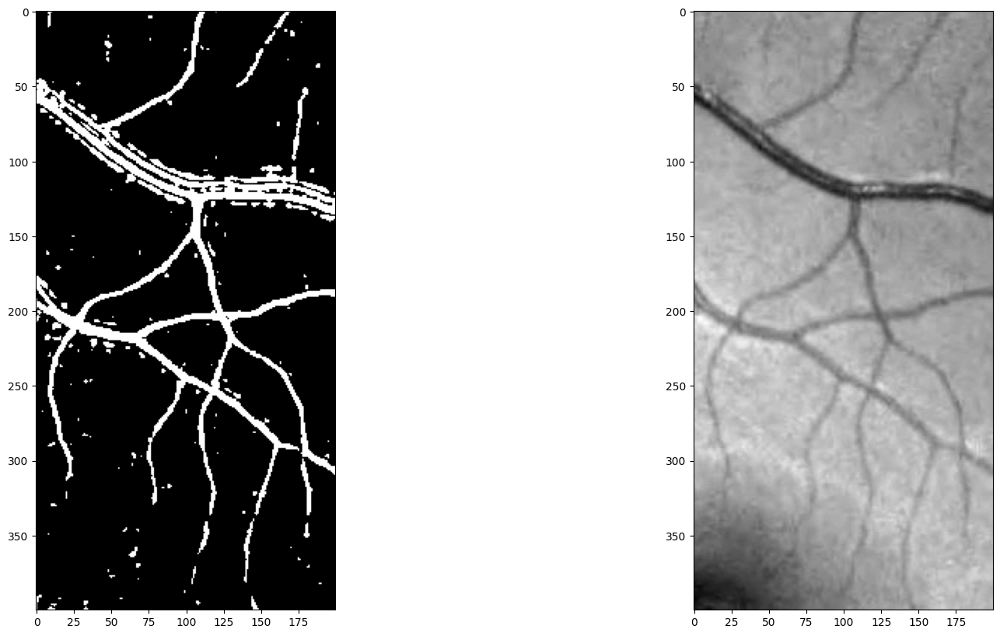

In [39]:
fig, ax = plt.subplots(ncols=2, figsize=(20, 10))
ax[0].imshow(res > skimage.filters.threshold_triangle(res), 'gray')
ax[1].imshow(image, 'gray')

1
0
[[[0 0 0 ... 0 0 0]
  [0 0 0 ... 0 0 0]
  [0 0 0 ... 0 0 0]
  ...
  [0 0 0 ... 0 0 0]
  [0 0 0 ... 0 0 0]
  [0 0 0 ... 0 0 0]]

 [[0 0 0 ... 0 0 0]
  [0 0 0 ... 0 0 0]
  [0 0 0 ... 0 0 0]
  ...
  [0 0 0 ... 0 0 0]
  [0 0 0 ... 0 0 0]
  [0 0 0 ... 0 0 0]]

 [[0 0 0 ... 0 0 0]
  [0 0 0 ... 0 0 0]
  [0 0 0 ... 0 0 0]
  ...
  [0 0 0 ... 0 0 0]
  [0 0 0 ... 0 0 0]
  [0 0 0 ... 0 0 0]]

 ...

 [[0 0 0 ... 0 0 0]
  [0 0 0 ... 0 0 0]
  [0 0 0 ... 0 0 0]
  ...
  [0 0 0 ... 0 0 0]
  [0 0 0 ... 0 0 0]
  [0 0 0 ... 0 0 0]]

 [[0 0 0 ... 0 0 0]
  [0 0 0 ... 0 0 0]
  [0 0 0 ... 0 0 0]
  ...
  [0 0 0 ... 0 0 0]
  [0 0 0 ... 0 0 0]
  [0 0 0 ... 0 0 0]]

 [[0 0 0 ... 0 0 0]
  [0 0 0 ... 0 0 0]
  [0 0 0 ... 0 0 0]
  ...
  [0 0 0 ... 0 0 0]
  [0 0 0 ... 0 0 0]
  [0 0 0 ... 0 0 0]]]


/home/xpetrus/DP/DP-WIP/.venv/lib/python3.13/site-packages/skimage/_shared/utils.py:328: UserWarning: se.tif is a low contrast image
  return func(*args, **kwargs)
/home/xpetrus/DP/DP-WIP/.venv/lib/python3.13/site-packages/skimage/_shared/utils.py:328: UserWarning: label.tif is a low contrast image
  return func(*args, **kwargs)


Region (10, 10, 10, 91, 91, 91)


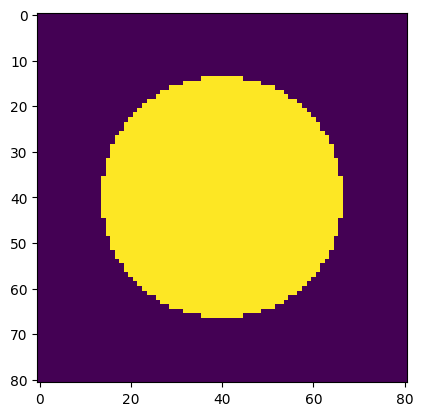

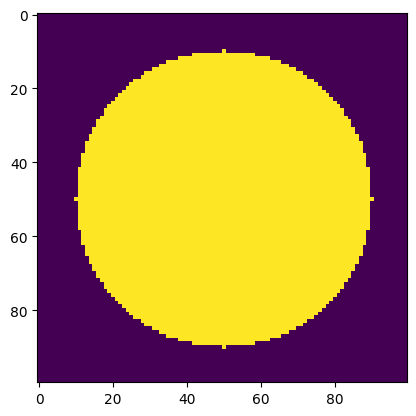

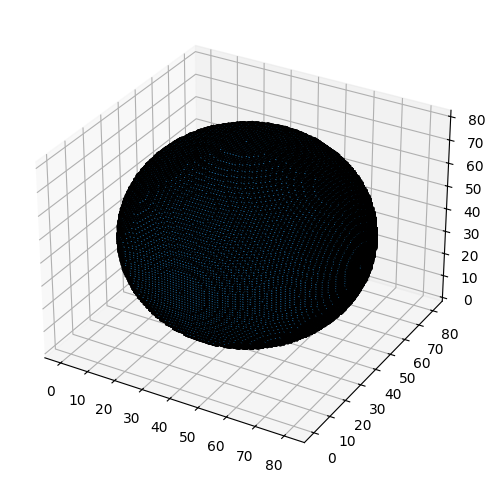

In [40]:
## import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from skimage import measure, morphology
from skimage.color import label2rgb
import sys

# Create a 3D array of random data
np.random.seed(0)
raw_data = np.random.rand(100, 100, 100)

# Create a 3D mask
filled = np.zeros_like(raw_data)
se = morphology.ball(40)

# Calculate the center of the array
center = np.array(filled.shape) // 2

# Calculate the slice indices to assign the ball to the filled array
slice_x = slice(center[0] - se.shape[0] // 2, center[0] + se.shape[0] // 2 + se.shape[0] % 2)
slice_y = slice(center[1] - se.shape[1] // 2, center[1] + se.shape[1] // 2 + se.shape[1] % 2)
slice_z = slice(center[2] - se.shape[2] // 2, center[2] + se.shape[2] // 2 + se.shape[2] % 2)

# Assign the ball to the filled array
filled[slice_x, slice_y, slice_z] = se

#filled[se] = True
print(se.max())
print(se.min())



plt.figure()
plt.imshow(se[10])

# Label the mask
label_image = measure.label(filled)
plt.figure()
plt.imshow(label_image[50])
skimage.io.imsave("filled.tif", filled)
skimage.io.imsave("se.tif", se)
skimage.io.imsave("label.tif", label_image.astype(np.uint8))

print(label_image)



# Create a 3D visualization of the labeled regions
fig = plt.figure(figsize=(10, 6))
ax = fig.add_subplot(111, projection='3d')

print(measure.regionprops(label_image))

# Loop over the labeled regions and add them to the visualization
for region in measure.regionprops(label_image):
    #break
    if region.label == 0:
        continue
    
    # Get the bounding box of the region
    minx, miny, minz, maxx, maxy, maxz = region.bbox

    # Add the region to the visualization
    ax.voxels(label_image[minx:maxx, miny:maxy, minz:maxz] == region.label, edgecolor='k')

    print(f"Region {region.bbox}")

# Show the visualization
plt.show()

In [41]:
np.unique(label_image)

array([0, 1])

In [42]:
# Create a 3D array with some random data
np.random.seed(0)
data = np.random.randint(0, 2, size=(10, 10, 10))

# Use the label function to assign labels to connected regions
labels = measure.label(data)

# Print the labels
print(labels)

[[[0 1 1 0 1 1 1 1 1 1]
  [1 0 0 1 0 0 0 0 0 1]
  [0 1 1 0 0 1 1 1 1 0]
  [1 0 1 0 1 1 0 1 1 0]
  [0 1 0 1 1 1 1 1 0 1]
  [0 1 1 1 1 0 1 0 0 1]
  [1 0 1 0 1 0 0 0 0 0]
  [1 1 0 0 0 1 1 0 1 0]
  [0 1 0 1 1 1 1 1 1 0]
  [1 1 0 0 1 0 0 1 1 0]]

 [[1 0 0 1 0 0 0 1 1 0]
  [1 0 0 0 0 0 1 0 1 0]
  [1 1 1 1 1 0 1 1 1 1]
  [0 1 1 0 0 1 0 0 0 0]
  [1 1 0 0 1 0 1 1 1 1]
  [0 0 0 1 0 1 1 1 0 1]
  [0 0 1 0 1 1 0 0 1 0]
  [1 0 1 0 1 0 1 0 0 0]
  [1 0 1 0 1 0 0 0 0 0]
  [1 0 0 1 0 0 0 1 0 0]]

 [[1 0 1 0 0 1 1 0 0 0]
  [1 1 0 0 0 0 0 1 0 1]
  [0 0 0 1 1 1 0 0 1 1]
  [1 1 0 0 0 1 1 0 1 0]
  [0 1 0 1 1 1 1 0 0 0]
  [1 1 1 0 1 1 1 1 0 0]
  [1 1 0 0 0 1 1 0 1 1]
  [1 1 1 0 0 0 1 0 1 0]
  [1 1 0 0 0 1 0 0 1 1]
  [1 1 0 1 0 0 0 0 1 1]]

 [[1 0 1 0 0 1 1 1 1 1]
  [1 0 0 1 1 1 1 1 1 1]
  [1 1 1 0 0 0 0 1 1 1]
  [0 1 1 1 1 1 1 1 0 0]
  [0 0 1 1 0 1 0 0 1 0]
  [1 0 1 0 0 0 0 1 1 1]
  [0 1 0 1 0 0 0 0 1 1]
  [1 0 1 0 0 1 1 1 0 1]
  [1 0 1 0 1 1 0 0 1 1]
  [0 1 1 1 1 1 1 0 0 1]]

 [[0 1 0 0 1 1 1 1 1 0]
  [1 1 1

Region (10, 10, 10, 91, 91, 91)


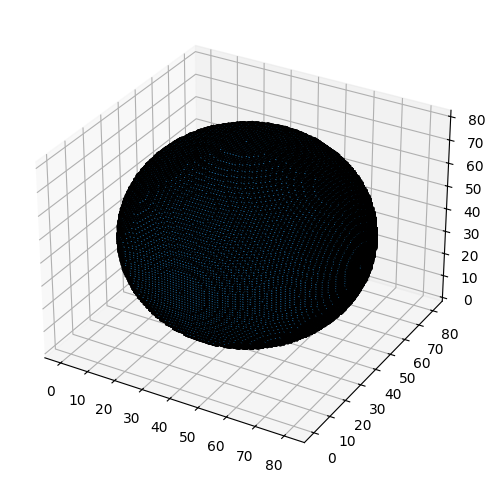

In [43]:
# Create a 3D visualization of the labeled regions
fig = plt.figure(figsize=(10, 6))
ax = fig.add_subplot(111, projection='3d')

print(measure.regionprops(label_image))

# Loop over the labeled regions and add them to the visualization
for region in measure.regionprops(label_image):
    #break
    if region.label == 0:
        continue
    
    # Get the bounding box of the region
    minx, miny, minz, maxx, maxy, maxz = region.bbox

    # Add the region to the visualization
    ax.voxels(label_image[minx:maxx, miny:maxy, minz:maxz] == region.label, edgecolor='k')

    print(f"Region {region.bbox}")

# Show the visualization
plt.show()